# GeoAI application to predict field scale ETa

**Keywords**
- GeoAI
- Field Scale ETa Prediction
- Feature Engineering
- Machine Learning
- Deep Learning

## Table of Contents
1. [Introduction](#introduction)
2. [Data Preparation](#data-preparation)
   - [2.1 Load ETa Data Collected from Ameriflux Tower](#load-eta-data-collected-from-ameriflux-tower)
   - [2.2 Load Vegetation Indices and Thermal Indices](#load-vegetation-indices-and-thermal-indices)
   - [2.3 Input and Output Merge and Interpolation](#input-and-output-merge-and-interpolation)
   - [2.4 Concatenate All the Stations Data Except US-Tw5](#concatenate-all-the-stations-data-except-us-tw5)
3. [Comparison of OpenETa and ETa from AmeriFlux Tower](#comparison-of-openeta-and-eta-from-ameriflux-tower)
   - [3.1 Time Series Plot of ETa from OpenET and Ameriflux](#time-series-plot-of-eta-from-openet-and-ameriflux)
   - [3.2 Independent Pair t-test](#independent-pair-t-test)
4. [Exploratory Data Analysis (EDA)](#exploratory-data-analysis-eda)
   - [4.1 Data Distribution Visualization](#data-distribution-visualization)
   - [4.2 Box Plot](#box-plot)
   - [4.3 Pair Plot](#pair-plot)
   - [4.4 Heat Map](#heat-map)
5. [Features Selection Methods](#features-selection-methods)
   - [5.1 Correlation Coefficient Based Feature Selection](#correlation-coefficient-based-feature-selection)
   - [5.2 Multicollinearity and Variance Inflation Factor (VIF) Based Feature Selection](#multicollinearity-and-variance-inflation-factor-vif-based-feature-selection)
   - [5.3 Tree Algorithm Based Variable Importance and Feature Selection](#tree-algorithm-based-variable-importance-and-feature-selection)
   - [5.4 Permutation Importance Based Feature Selection](#permutation-importance-based-feature-selection)
6. [Machine Learning Models to Predict ETa](#machine-learning-models-to-predict-eta)
   - [6.1 Multiple Linear Regression](#multiple-linear-regression)
   - [6.2 Random Forest Model](#random-forest-model)
   - [6.3 Gradient Boosting Regressor](#gradient-boosting-regressor)
   - [6.4 Hyperparameter Tuning Using GridSearch CV Method](#hyperparameter-tuning-using-gridsearch-cv-method)
7. [Deep Learning to Predict ETa](#deep-learning-to-predict-eta)
   - [7.1 Simple Artificial Neural Network (Only One Hidden Layer)](#simple-artificial-neural-network-only-one-hidden-layer)
   - [7.2 Deep Neural Networks](#deep-neural-networks)
   - [7.3 1D Convolutional Neural Networks](#1d-convolutional-neural-networks)
8. [Coclusion](#conclusion )

## 1. Introduction

This analysis is a project on **"GeoAI Application to Predict Field Scale ETa"** utilizing various machine learning and deep learning techniques. The purpose of this project is to predict field-scale actual evapotranspiration (ETa) using vegetation indices, thermal indices, and other relevant data collected from various stations. By integrating these advanced data analytics methods, the goal is to provide more accurate ETa predictions for different agricultural fields, improving water management practices.

Accurate estimation of ETa is essential for efficient water resource management, as it directly impacts irrigation planning and agricultural productivity. Current product like OpenET, while valuable, have limitations in capturing daily ETa values, which can lead to inconsistencies in water usage estimates. Overestimation or underestimation of ETa can result in either water wastage or inadequate irrigation, respectively. This project aims to address these challenges by developing predictive models that offer reliable daily ETa estimates. Throughout this analysis, this study will explore different feature selection methods and machine learning models to optimize ETa predictions, validating the results with data from Ameriflux towers.

# 2. Data Preparation
Data preparation is a critical step in this analysis, as it involves collecting and organizing the necessary inputs for model training and evaluation. This section focuses on loading ETa data from the Ameriflux Tower and gathering relevant vegetation and thermal indices. These datasets are then merged and interpolated to ensure consistency and completeness across different stations.

## 2.1 Load ETa data collected from Ameriflux Tower
The ETa data is sourced from Ameriflux Tower, providing detailed measurements of evapotranspiration and few weather variables. These data serves as the primary target variable and input features for the models.

In [38]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
US_myb = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Myb', parse_dates = ['Date'])
US_Sne = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Sne', parse_dates = ['Date'])
US_Snf = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Snf', parse_dates = ['Date'])
US_Tw1 = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Tw1', parse_dates = ['Date'])
US_Tw2 = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Tw2', parse_dates = ['Date'])
US_Tw3 = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Tw3', parse_dates = ['Date'])
US_Tw4 = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Tw4', parse_dates = ['Date'])
US_Tw5 = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Tw5', parse_dates = ['Date'])

## 2.2 Load Vegetation Indices and Thermal Indices
Vegetation indices and thermal indices are critical input features for predicting ETa. These indices are derived from remote sensing data, capturing the vegetation's health and surface temperature, which are key factors influencing ETa.

In [7]:
NDVI_EVI = pd.read_csv(r'D:\My PhD\Summer 2024\I_GUIDE\Data\MODIS_Indices\MODIS_NDVI_EVI_Extraction.csv', parse_dates = ['Date'])
FPAR_LAI = pd.read_csv(r'D:\My PhD\Summer 2024\I_GUIDE\Data\MODIS_Indices\MODIS_FPAR_LAI_Extraction.csv', parse_dates = ['Date'])
LST_DLST = pd.read_csv(r'D:\My PhD\Summer 2024\I_GUIDE\Data\MODIS_Indices\MODIS_LST_DLST_Extraction.csv', parse_dates = ['Date'])

## 2.3 Input and output Merge and Interpolation
To prepare the data for model training, the ETa values, vegetation indices, and thermal indices are merged and interpolated for gap filling. This step ensures that all datasets are aligned in time and space, providing a coherent dataset for analysis.

### 2.3.1 Station US-myb

In [8]:
# merge weather variables with vegetation indices for US-myb staton
US_myb1 = US_myb.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_myb2 = US_myb1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_myb_all_variables = US_myb2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_myb_all_variables['NDVI'] = US_myb_all_variables['NDVI'].interpolate(method='linear')
US_myb_all_variables['EVI'] = US_myb_all_variables['EVI'].interpolate(method='linear')
US_myb_all_variables['FPAR'] = US_myb_all_variables['FPAR'].interpolate(method='linear')
US_myb_all_variables['LAI'] = US_myb_all_variables['LAI'].interpolate(method='linear')
US_myb_all_variables['LST'] = US_myb_all_variables['LST'].interpolate(method='linear')
US_myb_all_variables['DLST'] = US_myb_all_variables['DLST'].interpolate(method='linear')

In [9]:
# drop rows if any Nan value contains
US_myb_all_variables.dropna(inplace =True)

### 2.3.2 Station US-Sne

In [10]:
# merge weather variables with vegetation indices for US-Sne staton
US_Sne1 = US_Sne.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_Sne2 = US_Sne1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_Sne_all_variables = US_Sne2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_Sne_all_variables['NDVI'] = US_Sne_all_variables['NDVI'].interpolate(method='linear')
US_Sne_all_variables['EVI'] = US_Sne_all_variables['EVI'].interpolate(method='linear')
US_Sne_all_variables['FPAR'] = US_Sne_all_variables['FPAR'].interpolate(method='linear')
US_Sne_all_variables['LAI'] = US_Sne_all_variables['LAI'].interpolate(method='linear')
US_Sne_all_variables['LST'] = US_Sne_all_variables['LST'].interpolate(method='linear')
US_Sne_all_variables['DLST'] = US_Sne_all_variables['DLST'].interpolate(method='linear')

In [11]:
# drop rows if any Nan value contains
US_Sne_all_variables.dropna(inplace =True)

### 2.3.3 Station US-Snf

In [12]:
# merge weather variables with vegetation indices for US-Snf staton
US_Snf1 = US_Snf.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_Snf2 = US_Snf1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_Snf_all_variables = US_Snf2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_Snf_all_variables['NDVI'] = US_Snf_all_variables['NDVI'].interpolate(method='linear')
US_Snf_all_variables['EVI'] = US_Snf_all_variables['EVI'].interpolate(method='linear')
US_Snf_all_variables['FPAR'] = US_Snf_all_variables['FPAR'].interpolate(method='linear')
US_Snf_all_variables['LAI'] = US_Snf_all_variables['LAI'].interpolate(method='linear')
US_Snf_all_variables['LST'] = US_Snf_all_variables['LST'].interpolate(method='linear')
US_Snf_all_variables['DLST'] = US_Snf_all_variables['DLST'].interpolate(method='linear')

In [13]:
# drop rows if any Nan value contains
US_Snf_all_variables.dropna(inplace =True)

### 2.3.4 Station US-Tw1

In [14]:
# merge weather variables with vegetation indices for US-Tw1 staton
US_Tw1_1 = US_Tw1.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw1_2 = US_Tw1_1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw1_all_variables = US_Tw1_2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_Tw1_all_variables['NDVI'] = US_Tw1_all_variables['NDVI'].interpolate(method='linear')
US_Tw1_all_variables['EVI'] = US_Tw1_all_variables['EVI'].interpolate(method='linear')
US_Tw1_all_variables['FPAR'] = US_Tw1_all_variables['FPAR'].interpolate(method='linear')
US_Tw1_all_variables['LAI'] = US_Tw1_all_variables['LAI'].interpolate(method='linear')
US_Tw1_all_variables['LST'] = US_Tw1_all_variables['LST'].interpolate(method='linear')
US_Tw1_all_variables['DLST'] = US_Tw1_all_variables['DLST'].interpolate(method='linear')

In [15]:
# drop rows if any Nan value contains
US_Tw1_all_variables.dropna(inplace =True)

### 2.3.5 Station US-Tw2

In [16]:
# merge weather variables with vegetation indices for US-Tw2 staton
US_Tw2_1 = US_Tw2.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw2_2 = US_Tw2_1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw2_all_variables = US_Tw2_2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_Tw2_all_variables['NDVI'] = US_Tw2_all_variables['NDVI'].interpolate(method='linear')
US_Tw2_all_variables['EVI'] = US_Tw2_all_variables['EVI'].interpolate(method='linear')
US_Tw2_all_variables['FPAR'] = US_Tw2_all_variables['FPAR'].interpolate(method='linear')
US_Tw2_all_variables['LAI'] = US_Tw2_all_variables['LAI'].interpolate(method='linear')
US_Tw2_all_variables['LST'] = US_Tw2_all_variables['LST'].interpolate(method='linear')
US_Tw2_all_variables['DLST'] = US_Tw2_all_variables['DLST'].interpolate(method='linear')

In [17]:
# drop rows if any Nan value contains
US_Tw2_all_variables.dropna(inplace =True)

### 2.3.6 Station US-Tw3

In [18]:
# merge weather variables with vegetation indices for US-Tw3 staton
US_Tw3_1 = US_Tw3.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw3_2 = US_Tw3_1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw3_all_variables = US_Tw3_2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_Tw3_all_variables['NDVI'] = US_Tw3_all_variables['NDVI'].interpolate(method='linear')
US_Tw3_all_variables['EVI'] = US_Tw3_all_variables['EVI'].interpolate(method='linear')
US_Tw3_all_variables['FPAR'] = US_Tw3_all_variables['FPAR'].interpolate(method='linear')
US_Tw3_all_variables['LAI'] = US_Tw3_all_variables['LAI'].interpolate(method='linear')
US_Tw3_all_variables['LST'] = US_Tw3_all_variables['LST'].interpolate(method='linear')
US_Tw3_all_variables['DLST'] = US_Tw3_all_variables['DLST'].interpolate(method='linear')

In [19]:
# drop rows if any Nan value contains
US_Tw3_all_variables.dropna(inplace =True)

### 2.3.7 Station US-Tw4

In [20]:
# merge weather variables with vegetation indices for US-Tw4 staton
US_Tw4_1 = US_Tw4.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw4_2 = US_Tw4_1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw4_all_variables = US_Tw4_2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_Tw4_all_variables['NDVI'] = US_Tw4_all_variables['NDVI'].interpolate(method='linear')
US_Tw4_all_variables['EVI'] = US_Tw4_all_variables['EVI'].interpolate(method='linear')
US_Tw4_all_variables['FPAR'] = US_Tw4_all_variables['FPAR'].interpolate(method='linear')
US_Tw4_all_variables['LAI'] = US_Tw4_all_variables['LAI'].interpolate(method='linear')
US_Tw4_all_variables['LST'] = US_Tw4_all_variables['LST'].interpolate(method='linear')
US_Tw4_all_variables['DLST'] = US_Tw4_all_variables['DLST'].interpolate(method='linear')

In [21]:
# drop rows if any Nan value contains
US_Tw4_all_variables.dropna(inplace =True)

### 2.3.8 Station US-Tw5

In [22]:
# merge weather variables with vegetation indices for US-Tw5 staton
US_Tw5_1 = US_Tw5.merge(NDVI_EVI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw5_2 = US_Tw5_1.merge(FPAR_LAI, how = 'left', on = ['Date', 'Site_Name'])
US_Tw5_all_variables = US_Tw5_2.merge(LST_DLST, how = 'left', on = ['Date', 'Site_Name'])

# Perform linear interpolation on NDVI, EVI, FPAR, LAI, LST, and DLST columns
US_Tw5_all_variables['NDVI'] = US_Tw5_all_variables['NDVI'].interpolate(method='linear')
US_Tw5_all_variables['EVI'] = US_Tw5_all_variables['EVI'].interpolate(method='linear')
US_Tw5_all_variables['FPAR'] = US_Tw5_all_variables['FPAR'].interpolate(method='linear')
US_Tw5_all_variables['LAI'] = US_Tw5_all_variables['LAI'].interpolate(method='linear')
US_Tw5_all_variables['LST'] = US_Tw5_all_variables['LST'].interpolate(method='linear')
US_Tw5_all_variables['DLST'] = US_Tw5_all_variables['DLST'].interpolate(method='linear')

In [23]:
# drop rows if any Nan value contains
US_Tw5_all_variables.dropna(inplace =True)

## 2.4 Concatenate all the stations data except US-Tw5
The data from all stations, except US-Tw5 which will be used for tp test our model in unseen site, are concatenated to create a comprehensive dataset for the analysis. This combined dataset will be used in subsequent steps for model training and validation.

In [24]:
df = pd.concat ([US_myb_all_variables, US_Sne_all_variables, US_Snf_all_variables, US_Tw1_all_variables, US_Tw2_all_variables, US_Tw3_all_variables, US_Tw4_all_variables], ignore_index = True)

In [48]:
df.columns 
# TA: Air Temperature (deg C)
# SW_IN: Shortwave radiation, incoming (W m-2)
# LW_IN:Longwave radiation, incomin (W m-2)
# VPD: Vapor Pressure Deficit (hPa)
# PA: Atmospheric pressure (Kpa)
# P: Precipitation (mm)
# WS: Wind speed (m s-1)
# LE: Latent heat turbulent flux (no storage correction) (W m-2)
# H: Sensible heat turbulent flux (no storage correction) (W m-2)
# ETa: Actual Evapotranspiration (mm/day)
# NDVI: Normalized Difference Vegetation Index
# EVI: Enhanced Vegetation Index
# FPAR: Fraction of Photosynthetically Active Radiation
# LAI: Leaf Area Index
# LST: Land Surface Temperature
# DLST: Daytime Land Surface Temperature

Index(['Date', 'Site_Name', 'TA', 'SW_IN', 'LW_IN', 'VPD', 'PA', 'P', 'WS',
       'LE', 'H', 'ETa', 'NDVI', 'EVI', 'FPAR', 'LAI', 'LST', 'DLST'],
      dtype='object')

# 3. Comparison of OpenETa and ETa from AmeriFlux Tower
This section compares the daily evapotranspiration (ETa) values derived from OpenET with those measured by the AmeriFlux Tower. The comparison aims to evaluate the accuracy of the OpenET estimates and identify any discrepancies or biases in the data. By understanding the differences between these datasets, we can assess the reliability of remote sensing products for capturing daily ETa dynamics.


In [29]:
# load AmeriFlux and OpenETa data
AmeriFlux_US_Myb = pd.read_excel(r'D:\My PhD\Summer 2024\I_GUIDE\Data\AmeriFlux_ETa\All_Tower_Clean_data.xlsx', sheet_name = 'US-Myb', parse_dates = ['Date'])
OpenETa_US_Myb = pd.read_csv(r'D:\My PhD\Summer 2024\I_GUIDE\Data\OpenETa\OpenETa_US_Myb_station_2019_2021.csv', parse_dates = ['Date'])

In [30]:
AmeriFlux_US_Myb .head(5)

,Date,Site_Name,TA,SW_IN,LW_IN,VPD,PA,P,WS,LE,H,ETa
0,2010-01-01,Mayberry Wetland,10.767,64.252,345.117,2.622,102.445,0.001,1.328,57.7050,23.93270,2.013958
1,2010-01-02,Mayberry Wetland,11.230,86.497,332.308,2.044,102.244,0.219,1.208,38.9442,1.40294,1.359789
2,2010-01-03,Mayberry Wetland,7.749,96.941,290.054,1.599,101.939,0.005,1.889,54.8205,10.70620,1.907795
3,2010-01-04,Mayberry Wetland,8.396,132.200,274.652,2.136,101.889,0.000,1.482,57.7050,23.93270,2.009414
4,2010-01-05,Mayberry Wetland,7.649,88.983,295.321,2.222,101.942,0.003,0.958,38.9442,1.40294,1.355159


In [31]:
OpenETa_US_Myb.head(5)

,Date,OpenETa
0,2019-01-01,1.636
1,2019-01-02,1.013
2,2019-01-03,1.013
3,2019-01-04,0.857
4,2019-01-05,0.935


In [32]:
# Filter the DataFrame to include only the dates from 2019 to 2021
AmeriFlux_US_Myb_filtered= AmeriFlux_US_Myb[(AmeriFlux_US_Myb['Date'] >= '2019-01-01') & (AmeriFlux_US_Myb['Date'] <= '2021-12-31')]

In [33]:
AmeriFlux_US_Myb_filtered.head(5)

,Date,Site_Name,TA,SW_IN,LW_IN,VPD,PA,P,WS,LE,H,ETa
3287,2019-01-01,Mayberry Wetland,7.393,138.181,235.861,5.939,101.911,0.00,4.476,53.17560,-27.05330,1.849925
3288,2019-01-02,Mayberry Wetland,5.878,133.203,255.465,3.980,102.065,0.00,0.980,9.46971,9.17483,0.328968
3289,2019-01-03,Mayberry Wetland,5.731,109.751,262.336,2.394,101.954,0.00,0.752,6.29387,6.97858,0.218612
3290,2019-01-04,Mayberry Wetland,4.079,111.281,265.310,1.632,101.199,0.00,0.897,6.42967,9.12483,0.222979
3291,2019-01-05,Mayberry Wetland,6.634,37.326,315.793,1.895,100.461,2.54,2.096,6.90846,-16.83860,0.240165


## 3.1 Time series plot of ETa from OpenET and Ameriflux
This section involves plotting the time series data of ETa from both OpenET and Ameriflux Tower to visually compare their performance. The comparison helps identify discrepancies between the two datasets.

Text(0, 0.5, 'Actual Evapotranspiration in mm/day')

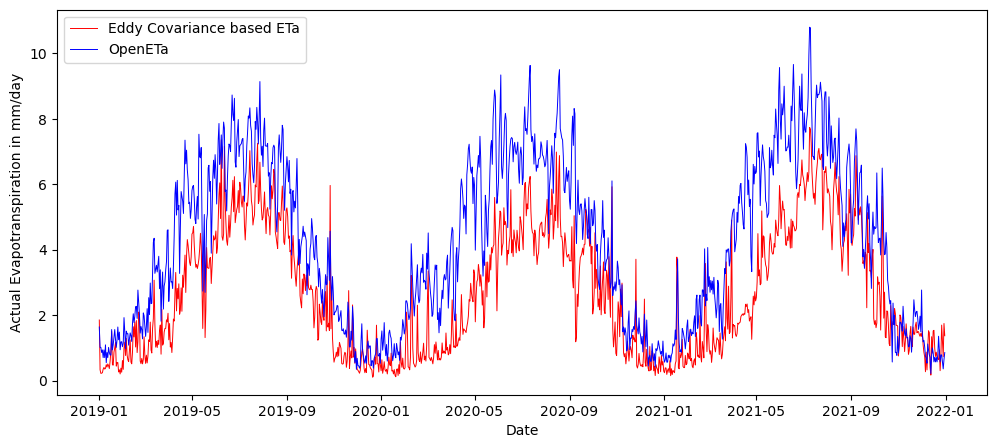

In [34]:
# plot time series of OpenETa and ETa from eddy covariance tower
plt.figure(figsize = (12, 5))
plt.plot(AmeriFlux_US_Myb_filtered['Date'], AmeriFlux_US_Myb_filtered['ETa'], color = 'r', linewidth = 0.7, label = 'Eddy Covariance based ETa')
plt.plot(OpenETa_US_Myb['Date'], OpenETa_US_Myb['OpenETa'], color = 'b', linewidth = 0.7, label = 'OpenETa')
plt.legend()
plt.xlabel('Date')
plt.ylabel('Actual Evapotranspiration in mm/day')

In [35]:
# Statistical indicators
from sklearn.metrics import r2_score, mean_squared_error
r2 = r2_score(AmeriFlux_US_Myb_filtered['ETa'],OpenETa_US_Myb['OpenETa'])
mse = mean_squared_error(AmeriFlux_US_Myb_filtered['ETa'],OpenETa_US_Myb['OpenETa'])
rmse = np.sqrt(mse)
print(f'R2: {r2:.2f}')
print(f'MSE: {mse:.2f}')
print(f'RMSE: {rmse:.2f} mm/day')

R2: -0.01
MSE: 3.70
RMSE: 1.92 mm/day


## 3.2 Independent Pair t-test
To statistically assess the differences between ETa values from OpenET and Ameriflux Tower, an independent pair t-test is conducted. This test evaluates whether the means of the two datasets differ significantly, providing insights into the reliability of OpenET estimates.

In [36]:
from scipy.stats import ttest_ind

# Perform independent t-test
t_stat, p_value = ttest_ind(AmeriFlux_US_Myb_filtered['ETa'], OpenETa_US_Myb['OpenETa'])

# Print the results
print(f'T-statistic: {t_stat:.2f}')
print(f'P-value: {p_value:.4f}')

if p_value < 0.05:
    print("The difference between the two ETa datasets is statistically significant.")
else:
    print("The difference between the two ETa datasets is not statistically significant.")

T-statistic: -15.98
P-value: 0.0000
The difference between the two ETa datasets is statistically significant.


# 4. Exploratory Data Analysis (EDA)
Exploratory Data Analysis (EDA) is crucial for understanding the underlying patterns and relationships in the data. This section includes various visualization techniques to explore the distribution, correlations, and interactions among the variables.

## 4.1 Data distribution visualization
Visualizing the distribution of data helps in identifying skewness, outliers, and the overall spread of variables, which is essential for selecting appropriate models and feature engineering techniques.

In [ ]:
df = df.drop(columns = ['Date', 'Site_Name'])

Text(0.5, 1.0, 'Histogram')

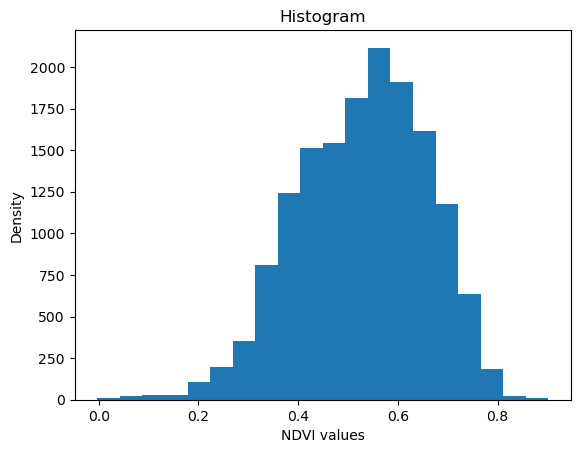

In [24]:
# distribution of ETa
plt.hist(df['NDVI'], bins = 20)
plt.xlabel('NDVI values')
plt.ylabel('Density')
plt.title('Histogram')

## 4.2 Box Plot
Box plots are used to summarize the distribution of data across different stations and variables, highlighting any potential outliers and variations in the data.

Text(0.5, 1.0, 'Box plot for Air Temperature')

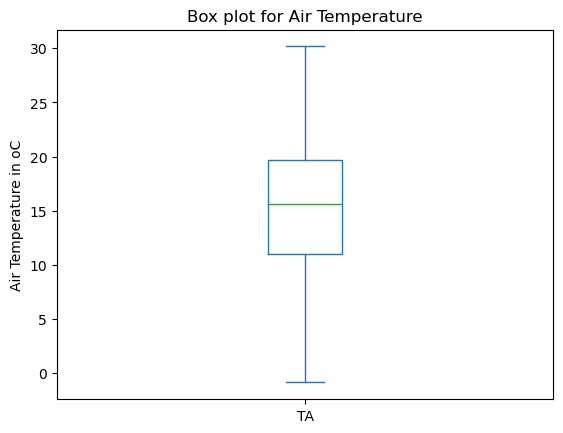

In [79]:
# Box plot for outliers detection
df['TA'].plot(kind = 'box')
plt.ylabel('Air Temperature in oC')
plt.title('Box plot for Air Temperature')

Text(0.5, 1.0, 'Box plot for Wind Speed')

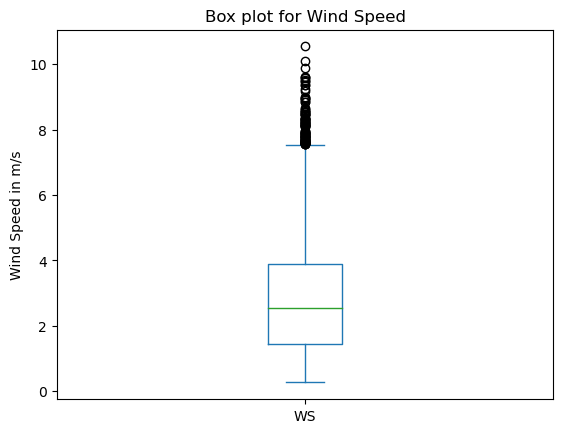

In [80]:
# Box plot for outliers detection
df['WS'].plot(kind = 'box')
plt.ylabel('Wind Speed in m/s')
plt.title('Box plot for Wind Speed')

In [89]:
# shape of input data before removing outlier rows
df.shape

(15333, 18)

In [86]:
# Removal of outliers (For example, if you think wind speed above 10 m/s is outlier)
df = df[df['WS'] < 10]

# shape of input data after removing outliers rows
df.shape

(15331, 16)

## 4.3 Pair Plot
Pair plots provide a comprehensive view of the relationships between different variables, enabling the identification of linear or non-linear correlations that may influence model performance.

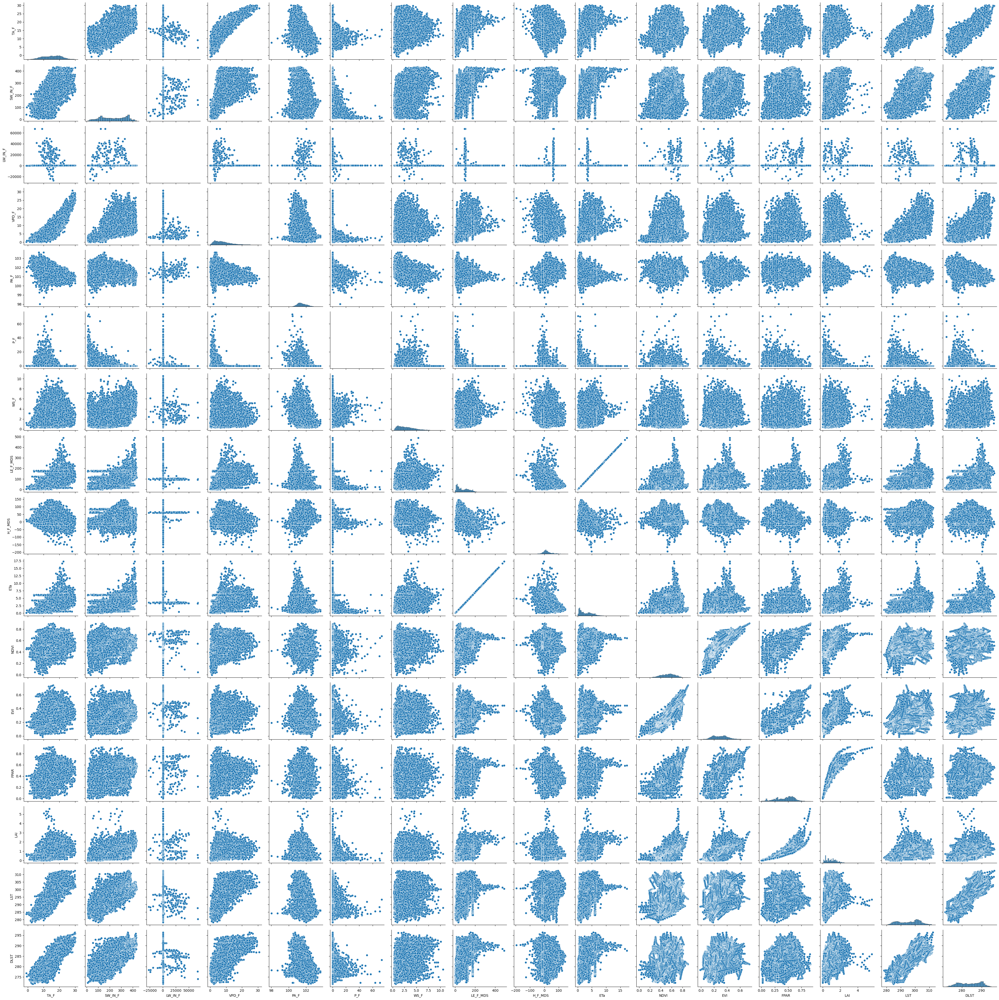

In [56]:
# Distribution of all input features and target using a pairplot
sns.pairplot(df, height=2.5)
plt.tight_layout() # plt.tight_layout() ensures that all plot elements are neatly arranged within the figure area, reducing or eliminating overlaps and ensuring that labels, titles, and other elements are visible and well-positioned
plt.savefig(r'D:\My PhD\Summer 2024\I_GUIDE\Results\Graphs\pair_plot.jpeg', dpi=500, bbox_inches='tight')

## 4.4 Heat Map
A heat map is used to visualize the correlation matrix, showing the strength and direction of relationships between different features. This information is crucial for feature selection and model building.

<AxesSubplot: >

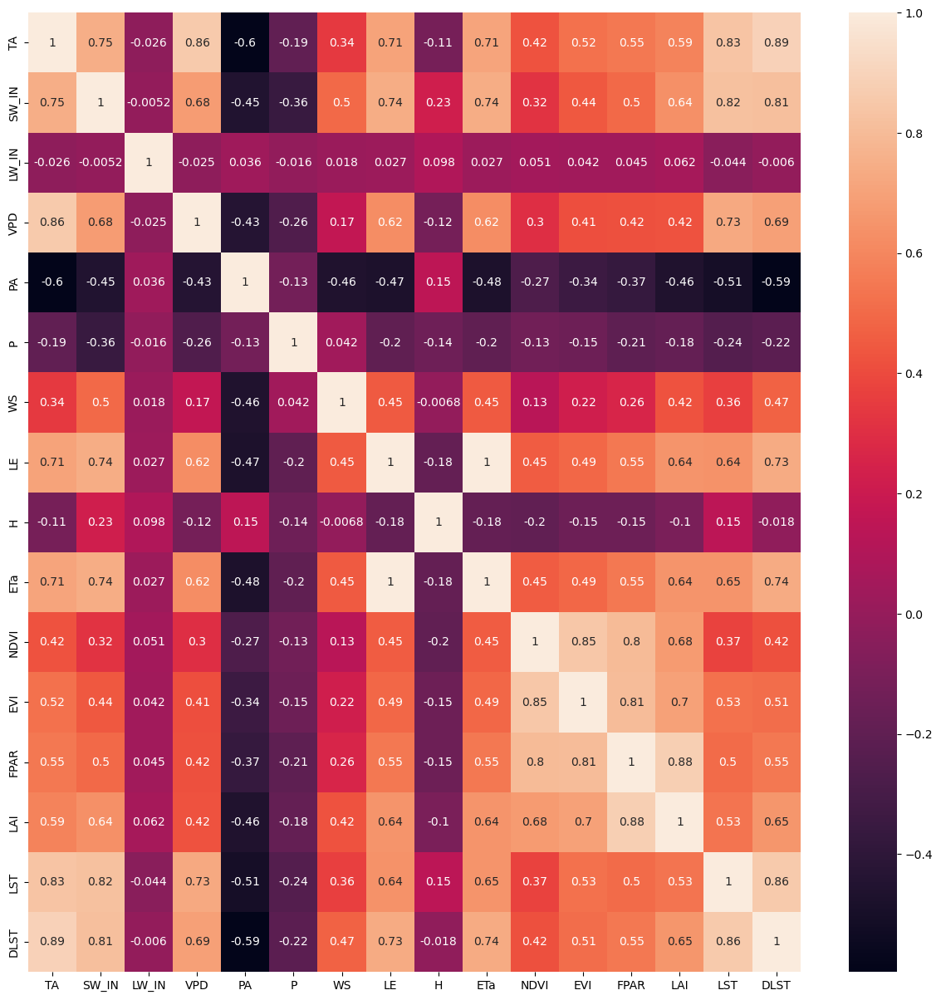

In [50]:
plt.figure(figsize = (15,15))
sns.heatmap(df.corr(), annot = True)

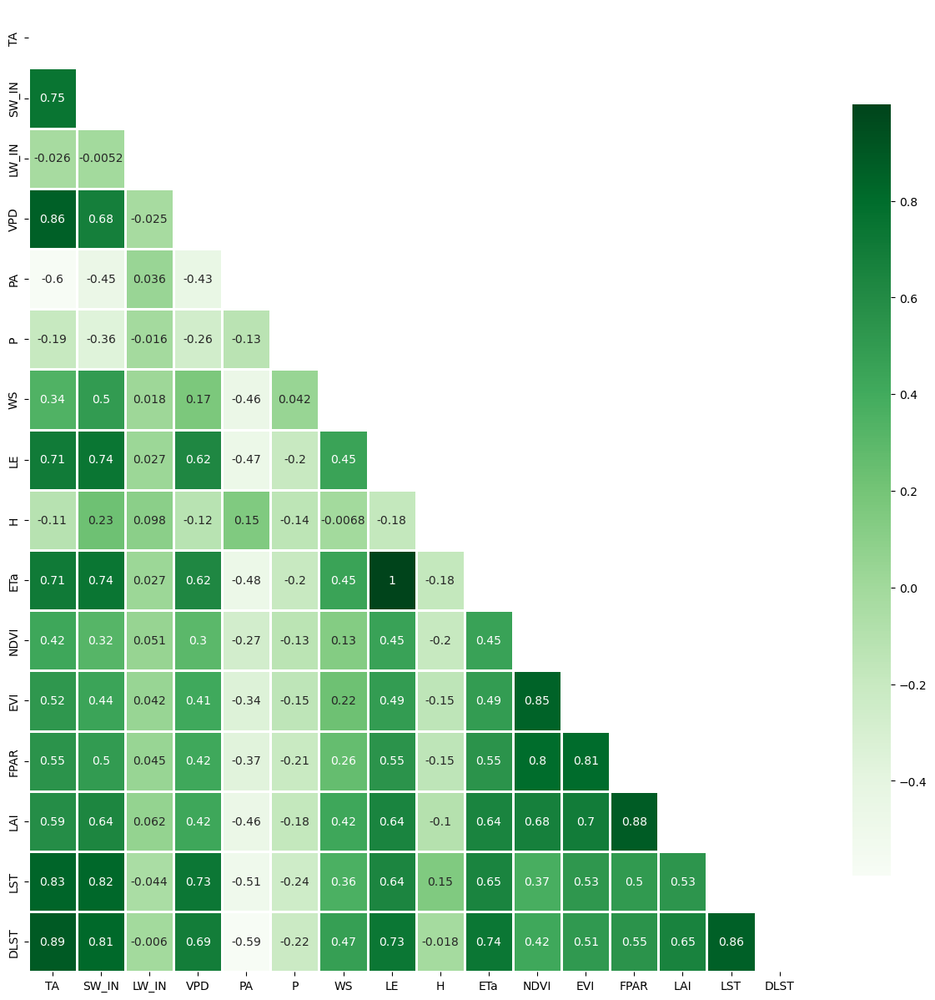

In [51]:
# for showing only half daigonal

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(df.corr(), dtype=bool)) # triu means upper triangle, np.ones_like creats the array of 1 that has same shape as the correlation matrix of df

plt.figure(figsize=(15, 15))


# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(df.corr(), mask=mask, annot=True, cmap='Greens', cbar_kws={"shrink": 0.8}, linewidths=.8) #cbar_kws: Specifies keyword arguments for the colorbar. In this case, {"shrink": 0.8} is used.
#mask=mask: This applies the mask created earlier to hide certain parts of the heatmap. In this case, it hides the upper triangle of the correlation matrix.
#linewidths=.8: This sets the width of the lines that will divide the heatmap cells.


plt.savefig(r'D:\My PhD\Summer 2024\I_GUIDE\Results\Graphs\heatmap.jpeg', dpi=500, bbox_inches='tight')
#dpi=500: This parameter sets the resolution of the saved figure in dots per inch (dpi).A higher dpi value means a higher resolution image. Here, 500 dpi is specified, resulting in a high-resolution image.
#bbox_inches='tight': This parameter controls the bounding box around the saved figure.

# 5. Features Selection Methods
Feature selection is a key step in the modeling process, as it involves identifying the most relevant variables that contribute to accurate ETa predictions. Various methods are applied to select the best set of features.

## 5.1. Correlation coefficient based Feature Selection
Correlation coefficients are used to assess the linear relationship between ETa and other features, selecting those with the strongest correlations for model inclusion.

<AxesSubplot: >

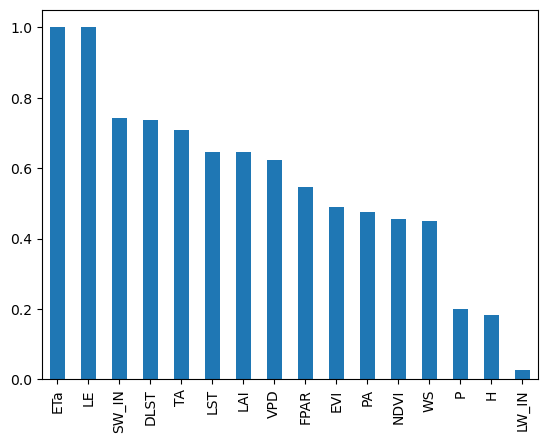

In [52]:
cor_ETa= abs(df.corr()['ETa']) # Some variables may have negative correlation. Thus, abs is used for absolute values
# Sort the Series in descending order
cor_ETa_sorted = cor_ETa.sort_values(ascending=False)
# plot the sorted sereis
cor_ETa_sorted.plot.bar()

## 5.2. Multicollinearity and Variance Inflation Factor (VIF) based feature selection
VIF is calculated to detect multicollinearity among the features. Features with high VIF values are removed to improve model stability and interpretability.

In [98]:
X = df.drop(columns = ['ETa', 'LE'])

<AxesSubplot: xlabel='features'>

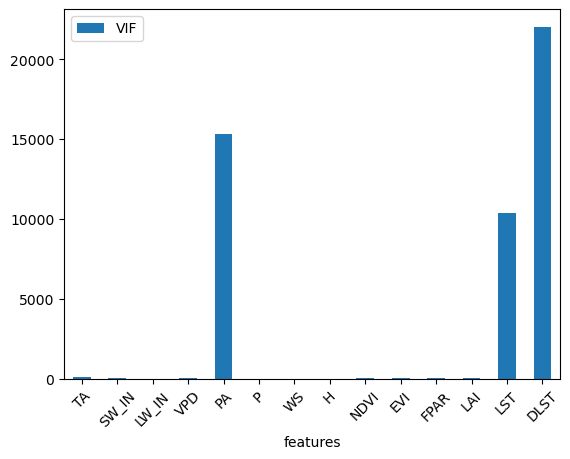

In [99]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns
vif.plot.bar(x = 'features',y = 'VIF', rot = 45)

## 5.3. Tree algorithm based variable importance and feature selection
Tree-based algorithms, such as Random Forest, are used to rank the importance of each feature in predicting ETa. Features with the highest importance scores are selected for the final model.

In [25]:
X = df.drop(columns = ['ETa', 'LE'])
y = df['ETa']

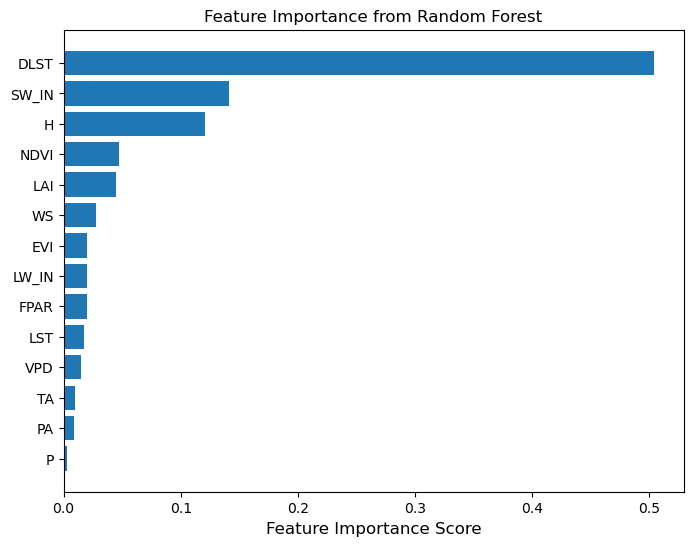

In [57]:
from sklearn.ensemble import RandomForestRegressor

# Train the Random Forest model
model = RandomForestRegressor(random_state = 42)
model.fit(X, y)

# Get feature importances
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]
feature_names = X.columns

# Create a horizontal bar chart
plt.figure(figsize=(8, 6))
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices], fontsize = 10)
plt.xlabel('Feature Importance Score', fontsize = 12)
plt.title('Feature Importance from Random Forest')
plt.gca().invert_yaxis()  # Highest importance at the top
# Save the plot to a file with tight bounding box
plt.savefig(r'D:\My PhD\Summer 2024\I_GUIDE\Results\Graphs\Feature_Importance_Score.jpeg', dpi=500, bbox_inches='tight')

## 5.4. Permutation Importance based feature selection
Permutation importance is used to measure the impact of each feature on model accuracy by randomly shuffling the feature values and observing the change in model performance.

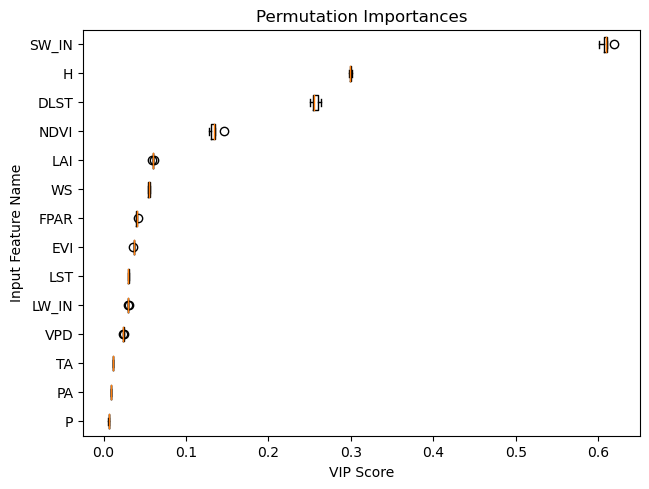

In [58]:
from sklearn.inspection import permutation_importance
P_VIP = permutation_importance(model, X ,y, n_repeats=5, random_state=1)
sorted_idx = P_VIP.importances_mean.argsort()
res_sorted_idx = np.flipud(sorted_idx)

# Display the importance
fig,ax = plt.subplots()
ax.boxplot(P_VIP.importances[sorted_idx].T,vert=False, labels=[feature_names[i] for i in sorted_idx])
ax.set_title("Permutation Importances")
fig.tight_layout()
ax.set_xlabel('VIP Score')
ax.set_ylabel('Input Feature Name')
# Save the plot to a file with tight bounding box
plt.savefig(r'D:\My PhD\Summer 2024\I_GUIDE\Results\Graphs\Permutation_Importace_Based.jpeg', dpi=500, bbox_inches='tight')

# 6. Machine Leanring Models to predict ETa
Machine learning models are applied to predict ETa based on the selected features. This section explores different models and their performance in predicting ETa.


In [24]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import LeaveOneOut, cross_val_score

In [27]:
# Splitting data into training and testing
from sklearn.model_selection import train_test_split
X = df[['DLST', 'SW_IN', 'H', 'NDVI', 'LAI']]
y = df['ETa']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25)

In [60]:
# Normalizing data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## 6.1. Multiple Linear Regression

In [61]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

LinearRegression()

In [62]:
# performance evaluation of model for training data sets
y_pred_train = lr.predict(X_train_scaled)
r2 = r2_score(y_train, y_pred_train)
mse = mean_squared_error(y_train, y_pred_train)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score for training is: {r2:.2f}')
print(f'RMSE for training is: {rmse:.2f}')
print(f'RRMSE for training is: {rrmse:.2f}%')

R2 score for training is: 0.70
RMSE for training is: 1.15
RRMSE for training is: 40.59%


In [63]:
# performance evaluation of model for testing data sets
y_pred_test = lr.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score for testing is: {r2:.2f}')
print(f'RMSE for testing is: {rmse:.2f}')
print(f'RRMSE for testing is: {rrmse:.2f}%')

R2 score for testing is: 0.71
RMSE for testing is: 1.12
RRMSE for testing is: 39.27%


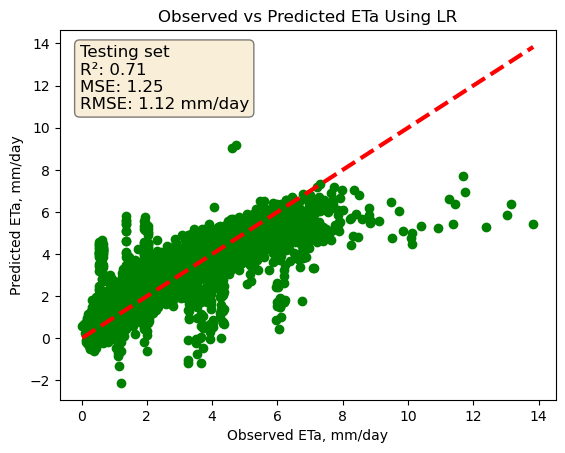

In [64]:
# Sccaltter plot for testing data sets
plt.scatter(y_test, y_pred_test, color='green')
plt.xlabel('Observed ETa, mm/day')
plt.ylabel('Predicted ETa, mm/day')
plt.title('Observed vs Predicted ETa Using LR')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw = 3)  # Adds a reference line

# Annotating the plot with the performance metrics
textstr = '\n'.join((
    'Testing set',
    f'R²: {r2:.2f}',
    f'MSE: {mse:.2f}',
    f'RMSE: {rmse:.2f} mm/day'
))
# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
# Place a text box in upper left in axes coords
plt.gca().text(0.04, 0.96, textstr, transform=plt.gca().transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.show()

In [66]:
# Model testing on Unseen data
X_unseen = US_Tw5_all_variables[['DLST', 'SW_IN', 'H', 'NDVI', 'LAI']]
y_unssen = US_Tw5_all_variables['ETa']

# Scaled the input features
X_unseen_scaled = scaler.transform(X_unseen)

#Predict Using fitted model
y_pred_unseen = lr.predict(X_unseen_scaled)
r2 = r2_score(y_unssen, y_pred_unseen)
mse = mean_squared_error(y_unssen, y_pred_unseen)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_unssen)*100
print(f'R2 score is: {r2:.2f}')
print(f'RMSE is: {rmse:.2f}')
print(f'RRMSE is: {rrmse:.2f}%')

R2 score is: 0.67
RMSE is: 1.08
RRMSE is: 33.64%


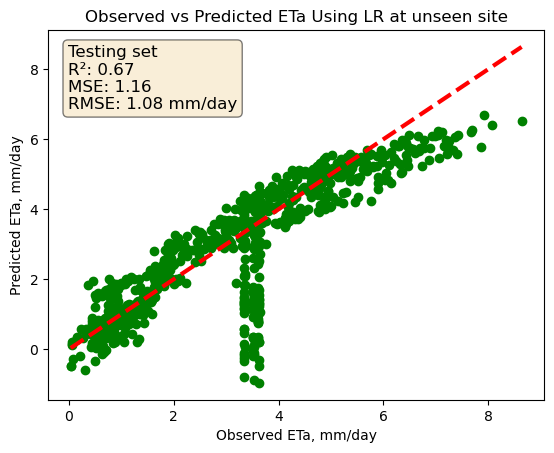

In [67]:
# Sccaltter plot for unseen data sets
plt.scatter(y_unssen, y_pred_unseen, color='green')
plt.xlabel('Observed ETa, mm/day')
plt.ylabel('Predicted ETa, mm/day')
plt.title('Observed vs Predicted ETa Using LR at unseen site')
plt.plot([y_unssen.min(), y_unssen.max()], [y_unssen.min(), y_unssen.max()], 'r--', lw = 3)  # Adds a reference line

# Annotating the plot with the performance metrics
textstr = '\n'.join((
    'Testing set',
    f'R²: {r2:.2f}',
    f'MSE: {mse:.2f}',
    f'RMSE: {rmse:.2f} mm/day'
))
# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
# Place a text box in upper left in axes coords
plt.gca().text(0.04, 0.96, textstr, transform=plt.gca().transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.show()

## 6.2. Random Forest Model

In [68]:
rf = RandomForestRegressor(n_estimators = 300, max_depth = 6, max_features= 3, random_state = 30)
rf.fit(X_train_scaled, y_train)

RandomForestRegressor(max_depth=6, max_features=3, n_estimators=300,
                      random_state=30)

In [69]:
# performance evaluation of model for training data sets
y_pred_train = rf.predict(X_train_scaled)
r2 = r2_score(y_train, y_pred_train)
mse = mean_squared_error(y_train, y_pred_train)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score for training is: {r2:.2f}')
print(f'RMSE for training is: {rmse:.2f}')
print(f'RRMSE for training is: {rrmse:.2f}%')

R2 score for training is: 0.80
RMSE for training is: 0.94
RRMSE for training is: 32.98%


In [70]:
# performance evaluation of model for testing data sets
y_pred_test = rf.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score for testing is: {r2:.2f}')
print(f'RMSE for testing is: {rmse:.2f}')
print(f'RRMSE for testing is: {rrmse:.2f}%')

R2 score for testing is: 0.79
RMSE for testing is: 0.97
RRMSE for testing is: 33.98%


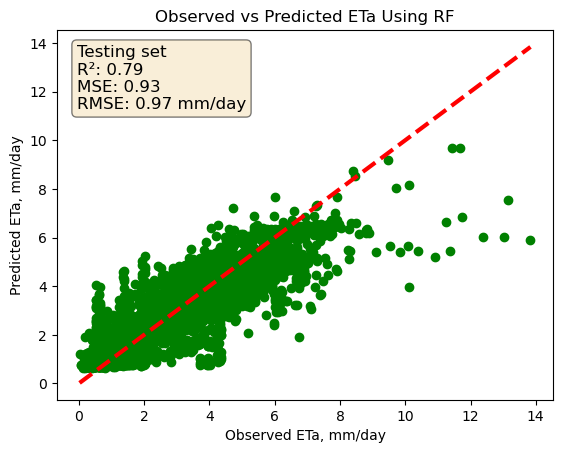

In [71]:
# Sccaltter plot for testing data sets
plt.scatter(y_test, y_pred_test, color='green')
plt.xlabel('Observed ETa, mm/day')
plt.ylabel('Predicted ETa, mm/day')
plt.title('Observed vs Predicted ETa Using RF')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw = 3)  # Adds a reference line

# Annotating the plot with the performance metrics
textstr = '\n'.join((
    'Testing set',
    f'R²: {r2:.2f}',
    f'MSE: {mse:.2f}',
    f'RMSE: {rmse:.2f} mm/day'
))
# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
# Place a text box in upper left in axes coords
plt.gca().text(0.04, 0.96, textstr, transform=plt.gca().transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.show()

In [64]:
# Model testing on Unseen data
X_unseen = US_Tw5_all_variables[['DLST', 'SW_IN_F', 'H_F_MDS', 'NDVI', 'LAI']]
y_unssen = US_Tw5_all_variables['ETa']

# Scaled the input features
X_unseen_scaled = scaler.transform(X_unseen)

#Predict Using fitted model
y_pred_unseen = rf.predict(X_unseen_scaled)
r2 = r2_score(y_unssen, y_pred_unseen)
mse = mean_squared_error(y_unssen, y_pred_unseen)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_unssen)*100
print(f'R2 score is: {r2:.2f}')
print(f'RMSE is: {rmse:.2f}')
print(f'RRMSE is: {rrmse:.2f}%')

R2 score is: 0.68
RMSE is: 1.06
RRMSE is: 33.28%


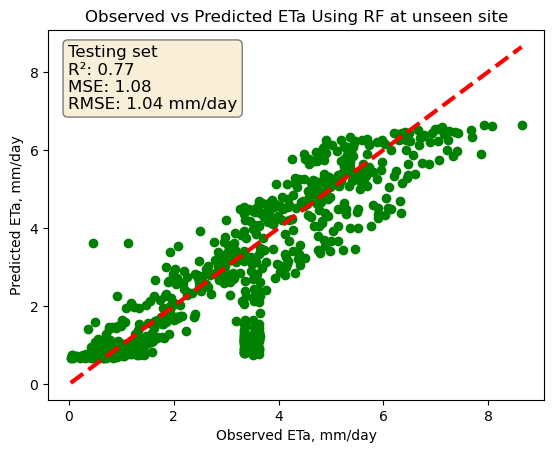

In [78]:
# Sccaltter plot for unseen data sets
plt.scatter(y_unssen, y_pred_unseen, color='green')
plt.xlabel('Observed ETa, mm/day')
plt.ylabel('Predicted ETa, mm/day')
plt.title('Observed vs Predicted ETa Using RF at unseen site')
plt.plot([y_unssen.min(), y_unssen.max()], [y_unssen.min(), y_unssen.max()], 'r--', lw = 3)  # Adds a reference line

# Annotating the plot with the performance metrics
textstr = '\n'.join((
    'Testing set',
    f'R²: {r2:.2f}',
    f'MSE: {mse:.2f}',
    f'RMSE: {rmse:.2f} mm/day'
))
# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
# Place a text box in upper left in axes coords
plt.gca().text(0.04, 0.96, textstr, transform=plt.gca().transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.show()

## 6.3 Gradient Boosting Regressor

In [69]:
gbm = GradientBoostingRegressor(n_estimators = 300,   min_samples_split = 6, max_depth = 3, learning_rate = 0.1, random_state = 30)
gbm.fit(X_train_scaled, y_train)

GradientBoostingRegressor(min_samples_split=6, n_estimators=300,
                          random_state=30)

In [70]:
# performance evaluation of model for training data sets
y_pred_train = gbm.predict(X_train_scaled)
r2 = r2_score(y_train, y_pred_train)
mse = mean_squared_error(y_train, y_pred_train)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score for training is: {r2:.2f}')
print(f'RMSE for training is: {rmse:.2f}')
print(f'RRMSE for training is: {rrmse:.2f}%')

R2 score for training is: 0.88
RMSE for training is: 0.73
RRMSE for training is: 26.03%


In [72]:
# performance evaluation of model for testing data sets
y_pred_test = gbm.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred_test)
mse = mean_squared_error(y_test, y_pred_test)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score for testing is: {r2:.2f}')
print(f'RMSE for testing is: {rmse:.2f}')
print(f'RRMSE for testing is: {rrmse:.2f}%')

R2 score for testing is: 0.84
RMSE for testing is: 0.87
RRMSE for testing is: 30.83%


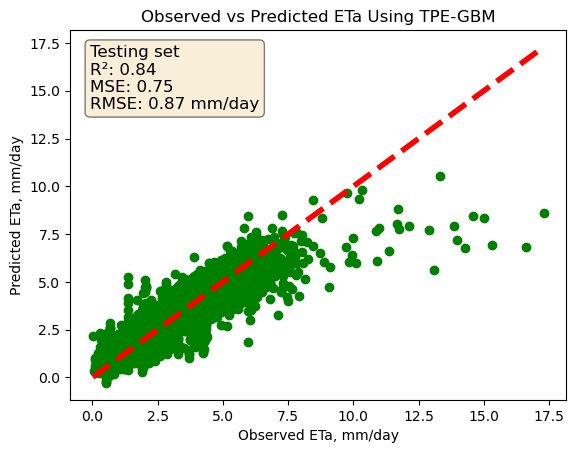

In [73]:
# Scatter plot for testing data sets
from matplotlib.ticker import FormatStrFormatter
plt.scatter(y_test, y_pred_test, color='green')
plt.xlabel('Observed ETa, mm/day')
plt.ylabel('Predicted ETa, mm/day')
plt.title('Observed vs Predicted ETa Using TPE-GBM')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw = 4)  # Adds a reference line

# Annotating the plot with the performance metrics
textstr = '\n'.join((
    'Testing set',
    f'R²: {r2:.2f}',
    f'MSE: {mse:.2f}',
    f'RMSE: {rmse:.2f} mm/day'
))
# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
# Place a text box in upper left in axes coords
plt.gca().text(0.04, 0.96, textstr, transform=plt.gca().transAxes, fontsize=12,
        verticalalignment='top', bbox=props)
plt.show()

In [79]:
# Model testing on Unseen data
X_unseen = US_Tw5_all_variables[['DLST', 'SW_IN', 'H', 'NDVI', 'LAI']]
y_unssen = US_Tw5_all_variables['ETa']

# Scaled the input features
X_unseen_scaled = scaler.transform(X_unseen)

#Predict Using fitted model
y_pred_unseen = gbm.predict(X_unseen_scaled)
r2 = r2_score(y_unssen, y_pred_unseen)
mse = mean_squared_error(y_unssen, y_pred_unseen)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_unssen)*100
print(f'R2 score is: {r2:.2f}')
print(f'RMSE is: {rmse:.2f}')
print(f'RRMSE is: {rrmse:.2f}%')

R2 score is: 0.74
RMSE is: 0.95
RRMSE is: 29.81%


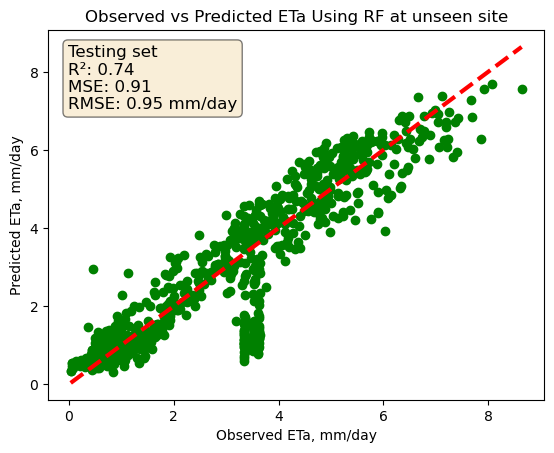

In [80]:
# Sccaltter plot for unseen data sets
plt.scatter(y_unssen, y_pred_unseen, color='green')
plt.xlabel('Observed ETa, mm/day')
plt.ylabel('Predicted ETa, mm/day')
plt.title('Observed vs Predicted ETa Using RF at unseen site')
plt.plot([y_unssen.min(), y_unssen.max()], [y_unssen.min(), y_unssen.max()], 'r--', lw = 3)  # Adds a reference line

# Annotating the plot with the performance metrics
textstr = '\n'.join((
    'Testing set',
    f'R²: {r2:.2f}',
    f'MSE: {mse:.2f}',
    f'RMSE: {rmse:.2f} mm/day'
))
# These are matplotlib.patch.Patch properties
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
# Place a text box in upper left in axes coords
plt.gca().text(0.04, 0.96, textstr, transform=plt.gca().transAxes, fontsize=12,
        verticalalignment='top', bbox=props)

plt.show()

## 6.4 Hyperparameter tuning using GridSearch CV method
Hyperparameter tuning is performed using the GridSearch CV method to optimize the performance of the machine learning models. This step involves testing different combinations of parameters and selecting the best-performing model.

In [ ]:
from sklearn.model_selection import GridSearchCV, KFold

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize the model
rf = RandomForestRegressor(random_state=42)

# Define the cross-validation scheme
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Initialize GridSearchCV
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=kf, scoring='neg_mean_squared_error')

# Fit GridSearchCV
grid_search.fit(X_train_scaled, y_train)

# Retrieve the best model
best_model = grid_search.best_estimator_

# Display the best parameters
print(f"Best parameters found: {grid_search.best_params_}")

In [ ]:
y_pred = best_model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score is: {r2:.2f}')
print(f'RMSE is: {rmse:.2f}')
print(f'RRMSE is: {rrmse:.2f}%')

# 7. Deep Learning to predict ETa
Deep learning models are employed to capture complex non-linear relationships between ETa and the input features, potentially improving prediction accuracy.

## 7.1 Simpel Artificial Neural Network (Only one hidden layer)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
# Splitting data into training and testing
X = df.drop(columns = ['ETa'])
y = df['ETa']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 20)

# Normalization of data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
import tensorflow as tf
from keras.layers import Dense
from keras.layers import Dense, BatchNormalization, Dropout

# build a input layer
from keras.layers import Input

# retrieve the dimension of input features
num_features = X_train.shape[1]

# Input Layer
input_layer = Input(shape = (num_features,))

# create a hidden layer
L = Dense (24, activation = 'relu') (input_layer)

# output layer and model summary
output_layer = Dense (1, activation = 'linear') (L)

# Build a model
from keras.models import Model
model = Model(input_layer, output_layer)
model.summary()

In [ ]:
from tensorflow.keras.optimizers import Adam, SGD

# Save the model
#model.save('Results/Best_model/single_hidden_layer_ann_model.keras')

# Save best model using checkpoint strategy
filepath = 'Results/Best_model/single_hidden_layer_ann_model.keras'
checkpoint = ModelCheckpoint(filepath, monitor='val_loss', verbose=1, save_best_only=True, mode='auto') #auto: The direction is automatically inferred from the name of the monitored quantity. For metrics like val_loss, where a decrease is better, it sets the mode to min. Conversely, for metrics like accuracy, where an increase is better, it sets the mode to max.
callbacks_list = [checkpoint]

# checkpoint: A variable that stores an instance of the ModelCheckpoint callback.
# ModelCheckpoint: A callback provided by Keras that saves the model after every epoch.
# filepath: The path where the model will be saved, as defined in the previous line.
# monitor='val_loss': Specifies that the validation loss will be monitored. The model with the lowest validation loss will be saved.
# verbose=1: Enables verbose output, so you will get messages in the console when the model is saved.
# save_best_only=True: Ensures that only the best model (the one with the lowest validation loss) will be saved, not every model after each epoch.
# mode='auto': Automatically determines whether to minimize or maximize the monitored quantity based on its name. For val_loss, a decrease is better, so it sets the mode to 'min'.
# [checkpoint]: The list contains the checkpoint callback. This list can be passed to the model's fit method to enable the checkpointing during training.

# compilation of model
model.compile(optimizer=Adam(learning_rate = 0.001), loss='mean_squared_error', metrics=['mean_absolute_error'])

# modelfitting
history = model.fit(X_train_scaled, y_train, epochs=200, batch_size=32, validation_split=0.2, callbacks=callbacks_list)

In [ ]:
from tensorflow.keras.models import load_model
from sklearn.metrics import mean_squared_error, r2_score

# Load the saved model
Saved_model = load_model('Results/Best_model/single_hidden_layer_ann_model.keras')

# Make predictions on the test data
y_pred = Saved_model.predict(X_train_scaled)
r2 = r2_score(y_train, y_pred)
mse = mean_squared_error(y_train, y_pred)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score is: {r2:.2f}')
print(f'RMSE is: {rmse:.2f}')
print(f'RRMSE is: {rrmse:.2f}%')

In [ ]:
# Performance metrics for testing data
y_pred = Saved_model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score is: {r2:.2f}')
print(f'RMSE is: {rmse:.2f}')
print(f'RRMSE is: {rrmse:.2f}%')

In [ ]:
%matplotlib inline
# list all data in history
print(history.history.keys())

# visualize the training loss across different epochs
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Number of Epochs')
plt.legend(['Training Loss', 'Validation Loss'], loc = 'upper right')

 ## 7.2. Deep Neural Networks

In [28]:
import tensorflow as tf
from keras.layers import Dense
from keras.layers import Dense, BatchNormalization, Dropout

# build a input layer
from keras.layers import Input

# retrieve the dimension of input features
num_features = X_train.shape[1]

# define a specific seed to control random status and enforce model reproduceability
np.random.seed(1)

# Input Layer
input_layer = Input(shape = (num_features,))

# create a hidden layer
L1 = Dense (24, activation = 'relu') (input_layer)
L2 = Dense (48, activation = 'relu') (L1)
L3 = BatchNormalization() (L2)
L4 = Dense (64, activation = 'relu') (L3)
L5 = Dense (128, activation = 'relu') (L4)
L6 = BatchNormalization() (L5)
L7 = Dense (256, activation = 'relu') (L6)
L8 = Dense (512, activation = 'relu') (L7)
L9 = BatchNormalization() (L8)
L10 = Dropout(0.1) (L9)

# output layer and model summary
output_layer = Dense (1, activation = 'linear') (L10)

# Build a model
from keras.models import Model
dnn_model = Model(input_layer, output_layer)
dnn_model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5)]               0         
                                                                 
 dense (Dense)               (None, 24)                144       
                                                                 
 dense_1 (Dense)             (None, 48)                1200      
                                                                 
 batch_normalization (Batch  (None, 48)                192       
 Normalization)                                                  
                                                                 
 dense_2 (Dense)             (None, 64)                3136      
                                                                 
 dense_3 (Dense)             (None, 128)               8320      
                                                            

In [44]:
# save best model using checkpoint strategy
filepath = 'D:\My PhD\Summer 2024\I_GUIDE\Results\Best_model\best_dnn_model.hdf5'
checkpoint = ModelCheckpoint(filepath, monitor = 'val_loss', verbose = 1, save_best_only = True, mode = 'auto') #auto: The direction is automatically inferred from the name of the monitored quantity. For metrics like val_loss, where a decrease is better, it sets the mode to min. Conversely, for metrics like accuracy, where an increase is better, it sets the mode to max.
callbacks_list = [checkpoint]

# Compile the model
dnn_model.compile(optimizer=Adam(learning_rate=0.001), loss='mse', metrics=['mae'])

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the model
history = dnn_model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_split=0.2, callbacks=[early_stopping])

Epoch 1/50


288/288 [==============================] - 1s 2ms/step - loss: 1.6985 - mae: 0.8570 - val_loss: 1.3371 - val_mae: 0.7520
Epoch 2/50
288/288 [==============================] - 0s 1ms/step - loss: 1.1292 - mae: 0.6907 - val_loss: 1.2721 - val_mae: 0.6929
Epoch 3/50
288/288 [==============================] - 0s 1ms/step - loss: 1.0967 - mae: 0.6836 - val_loss: 1.1803 - val_mae: 0.6879
Epoch 4/50
288/288 [==============================] - 0s 1ms/step - loss: 1.0592 - mae: 0.6687 - val_loss: 1.1695 - val_mae: 0.7064
Epoch 5/50
288/288 [==============================] - 0s 1ms/step - loss: 1.0542 - mae: 0.6748 - val_loss: 1.1464 - val_mae: 0.6624
Epoch 6/50
288/288 [==============================] - 0s 1ms/step - loss: 1.0155 - mae: 0.6633 - val_loss: 1.1189 - val_mae: 0.6670
Epoch 7/50
288/288 [==============================] - 0s 1ms/step - loss: 0.9892 - mae: 0.6568 - val_loss: 1.1750 - val_mae: 0.7244
Epoch 8/50
288/288 [==============================] - 0s 1ms/step - loss: 

In [45]:
y_pred = dnn_model.predict(X_test_scaled)
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rrmse = rmse/np.mean(y_test)*100
print(f'R2 score is: {r2:.2f}')
print(f'RMSE is: {rmse:.2f}')
print(f'RRMSE is: {rrmse:.2f}%')

120/120 [==============================] - 0s 652us/step
R2 score is: 0.82
RMSE is: 0.88
RRMSE is: 31.27%


dict_keys(['loss', 'mae', 'val_loss', 'val_mae'])


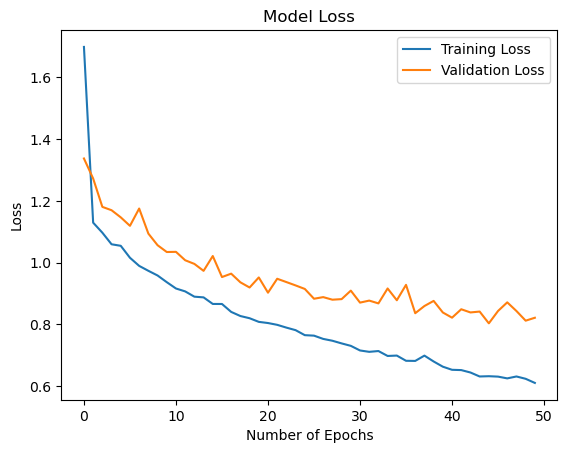

In [51]:
# list all data in history
print(history.history.keys())

# visualize the training loss across different epochs
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Number of Epochs')
plt.legend(['Training Loss', 'Validation Loss'], loc = 'upper right')

## 7.3. 1D Convolutional Neural Networks

In [27]:
import numpy as np
import pandas as pd
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model

In [32]:
# Reshape the data to fit the model input
X_train_scaled_reshape = X_train_scaled.reshape((X_train_scaled.shape[0], X_train_scaled.shape[1], 1))
X_test_scaled_reshape = X_test_scaled.reshape((X_test_scaled.shape[0], X_test_scaled.shape[1], 1))

In [29]:
# Define the model architecture
model = Sequential()
model.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train.shape[1], 1)))

# Suppose you have a 1D input sequence: [1, 2, 3, 4, 5].
# You define a filter (or kernel) with values [0.2, 0.5].
# The convolution operation would start by placing the filter at the beginning of the sequence and computing the dot product: (1*0.2) + (2*0.5) = 0.2 + 1.0 = 1.2
# A convolutional layer typically has multiple filters. Each filter detects different features or patterns in the input data.
# filters=64: This means the convolutional layer has 64 different filters (kernels). Each of these filters will produce a separate feature map, so the output of this convolutional layer will have 64 channels.
# kernel_size=2: Each filter will cover 2 consecutive elements of the input data at a time.  

model.add(MaxPooling1D(pool_size=2))

# It reduces the dimensionality of the input, which helps to decrease the computational load and to capture dominant features more effectively.
# Input: [1, 3, 2, 5, 4, 6]
# With pool_size=2, the max pooling operation will:
# Look at the first two elements [1, 3] and take the maximum, which is 3.
# Move the window to the next two elements [2, 5] and take the maximum, which is 5.
# Move the window to the next two elements [4, 6] and take the maximum, which is 6.
# Output: [3, 5, 6]

model.add(Flatten())
model.add(Dense(128, activation='relu'))# Added more neurons for a potentially deeper representation
model.add(Dropout(0.15))  # Dropout layer to reduce overfitting
model.add(Dense(1))  # Output layer for regression

# Model summary
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4, 64)             192       
                                                                 
 flatten (Flatten)           (None, 256)               0         
                                                                 
 dense (Dense)               (None, 128)               32896     
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 33217 (129.75 KB)
Trainable params: 33217 (129.75 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [43]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

checkpoint_path = r'D:\My PhD\Summer 2024\I_GUIDE\Results\Best_model\\best_model_cnn.h5'

# Set up the ModelCheckpoint callback to save the best model
checkpoint = ModelCheckpoint(checkpoint_path, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

# Fit the model
history = model.fit(X_train_scaled_reshape, y_train, epochs=200, batch_size= 16, validation_split=0.20, callbacks=[checkpoint], verbose=1)

# After training, you can load the best model
saved_model_cnn = load_model(checkpoint_path)

Epoch 1/200
567/575 [============================>.] - ETA: 0s - loss: 0.7340
Epoch 1: val_loss improved from inf to 0.76537, saving model to D:\My PhD\Summer 2024\I_GUIDE\Results\Best_model\best_model_cnn.h5
575/575 [==============================] - 1s 2ms/step - loss: 0.7328 - val_loss: 0.7654
Epoch 2/200
102/575 [====>.........................] - ETA: 0s - loss: 0.7570

C:\Users\erman\AppData\Roaming\Python\Python39\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


567/575 [============================>.] - ETA: 0s - loss: 0.7386
Epoch 2: val_loss did not improve from 0.76537
575/575 [==============================] - 1s 2ms/step - loss: 0.7399 - val_loss: 0.7786
Epoch 3/200
552/575 [===========================>..] - ETA: 0s - loss: 0.7453
Epoch 3: val_loss did not improve from 0.76537
575/575 [==============================] - 1s 2ms/step - loss: 0.7341 - val_loss: 0.7992
Epoch 4/200
545/575 [===========================>..] - ETA: 0s - loss: 0.7422
Epoch 4: val_loss improved from 0.76537 to 0.76349, saving model to D:\My PhD\Summer 2024\I_GUIDE\Results\Best_model\best_model_cnn.h5
575/575 [==============================] - 1s 2ms/step - loss: 0.7386 - val_loss: 0.7635
Epoch 5/200
571/575 [============================>.] - ETA: 0s - loss: 0.7475
Epoch 5: val_loss did not improve from 0.76349
575/575 [==============================] - 1s 2ms/step - loss: 0.7492 - val_loss: 0.7692
Epoch 6/200
568/575 [============================>.] - ETA: 0s - los

575/575 [==============================] - 1s 2ms/step - loss: 0.7109 - val_loss: 0.7400
Epoch 39/200
565/575 [============================>.] - ETA: 0s - loss: 0.7064
Epoch 39: val_loss improved from 0.74001 to 0.73558, saving model to D:\My PhD\Summer 2024\I_GUIDE\Results\Best_model\best_model_cnn.h5
575/575 [==============================] - 1s 2ms/step - loss: 0.7055 - val_loss: 0.7356
Epoch 40/200
569/575 [============================>.] - ETA: 0s - loss: 0.7104
Epoch 40: val_loss did not improve from 0.73558
575/575 [==============================] - 1s 2ms/step - loss: 0.7109 - val_loss: 0.7618
Epoch 41/200
554/575 [===========================>..] - ETA: 0s - loss: 0.7197
Epoch 41: val_loss did not improve from 0.73558
575/575 [==============================] - 1s 2ms/step - loss: 0.7232 - val_loss: 0.7647
Epoch 42/200
551/575 [===========================>..] - ETA: 0s - loss: 0.7088
Epoch 42: val_loss did not improve from 0.73558
575/575 [==============================] - 1s 2m

Epoch 113/200
565/575 [============================>.] - ETA: 0s - loss: 0.6447
Epoch 113: val_loss did not improve from 0.72043
575/575 [==============================] - 1s 2ms/step - loss: 0.6506 - val_loss: 0.8300
Epoch 114/200
569/575 [============================>.] - ETA: 0s - loss: 0.6632
Epoch 114: val_loss did not improve from 0.72043
575/575 [==============================] - 1s 2ms/step - loss: 0.6669 - val_loss: 0.7750
Epoch 115/200
560/575 [============================>.] - ETA: 0s - loss: 0.6511
Epoch 115: val_loss did not improve from 0.72043
575/575 [==============================] - 1s 2ms/step - loss: 0.6490 - val_loss: 0.7555
Epoch 116/200
563/575 [============================>.] - ETA: 0s - loss: 0.6585
Epoch 116: val_loss did not improve from 0.72043
575/575 [==============================] - 1s 2ms/step - loss: 0.6627 - val_loss: 0.7536
Epoch 117/200
575/575 [==============================] - ETA: 0s - loss: 0.6746
Epoch 117: val_loss did not improve from 0.72043

Epoch 150/200
559/575 [============================>.] - ETA: 0s - loss: 0.6459
Epoch 150: val_loss did not improve from 0.70318
575/575 [==============================] - 1s 2ms/step - loss: 0.6461 - val_loss: 0.7516
Epoch 151/200
568/575 [============================>.] - ETA: 0s - loss: 0.6673
Epoch 151: val_loss did not improve from 0.70318
575/575 [==============================] - 1s 2ms/step - loss: 0.6647 - val_loss: 0.7371
Epoch 152/200
574/575 [============================>.] - ETA: 0s - loss: 0.6466
Epoch 152: val_loss did not improve from 0.70318
575/575 [==============================] - 1s 2ms/step - loss: 0.6468 - val_loss: 0.7593
Epoch 153/200
575/575 [==============================] - ETA: 0s - loss: 0.6374
Epoch 153: val_loss did not improve from 0.70318
575/575 [==============================] - 1s 2ms/step - loss: 0.6374 - val_loss: 0.7347
Epoch 154/200
557/575 [============================>.] - ETA: 0s - loss: 0.6284
Epoch 154: val_loss did not improve from 0.70318

Epoch 187/200
568/575 [============================>.] - ETA: 0s - loss: 0.6257
Epoch 187: val_loss did not improve from 0.69559
575/575 [==============================] - 1s 2ms/step - loss: 0.6251 - val_loss: 0.7487
Epoch 188/200
562/575 [============================>.] - ETA: 0s - loss: 0.6393
Epoch 188: val_loss did not improve from 0.69559
575/575 [==============================] - 1s 2ms/step - loss: 0.6344 - val_loss: 0.7097
Epoch 189/200
561/575 [============================>.] - ETA: 0s - loss: 0.6247
Epoch 189: val_loss did not improve from 0.69559
575/575 [==============================] - 1s 2ms/step - loss: 0.6263 - val_loss: 0.7138
Epoch 190/200
568/575 [============================>.] - ETA: 0s - loss: 0.6356
Epoch 190: val_loss did not improve from 0.69559
575/575 [==============================] - 1s 2ms/step - loss: 0.6361 - val_loss: 0.7639
Epoch 191/200
566/575 [============================>.] - ETA: 0s - loss: 0.6265
Epoch 191: val_loss did not improve from 0.69559

In [44]:
# Evaluating the model on the test set
y_pred_cnn = saved_model_cnn.predict(X_test_scaled_reshape)
y_pred_cnn_reshape = y_pred_cnn.reshape(-1)
r2_cnn = r2_score(y_test, y_pred_cnn_reshape)
mse_cnn = mean_squared_error(y_test, y_pred_cnn_reshape)
rmse_cnn = np.sqrt(mse_cnn)
mbe_cnn = np.mean(y_test - y_pred_cnn_reshape)  # MBE

# Displaying the best parameters and test set evaluation metrics
print(f'R2 score on test set: {r2_cnn:.2f}')
print(f'RMSE on test set: {rmse_cnn:.2f}')
print(f'MBE: {mbe_cnn:.2f}')

120/120 [==============================] - 0s 1ms/step
R2 score on test set: 0.83
RMSE on test set: 0.90
MBE: -0.02


dict_keys(['loss', 'val_loss'])


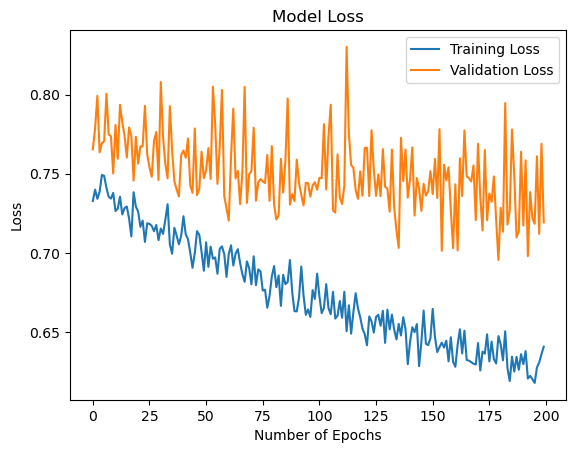

In [45]:
# list all data in history
print(history.history.keys())

# visualize the training loss across different epochs
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Number of Epochs')
plt.legend(['Training Loss', 'Validation Loss'], loc = 'upper right')

# 8. Conclusion

This project demonstrates the application of GeoAI techniques in predicting field-scale actual evapotranspiration (ETa). By integrating machine learning and deep learning models with advanced feature selection methods, the study aims to provide more accurate daily ETa estimates, overcoming the limitations of existing tools like OpenET. The results highlight the importance of selecting relevant features and optimizing model parameters to achieve reliable predictions. The findings from this analysis can contribute to better water management practices in agriculture, ensuring efficient use of water resources and enhancing crop productivity. Future work could explore the integration of additional data sources or the application of more sophisticated deep learning models to further improve prediction accuracy.